<a href="https://colab.research.google.com/github/jithamanyu001/DetTag/blob/main/Complete_Pipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install "paddleocr>=2.0.1" -q
!python3 setup.py bdist_wheel -q
!pip3 install dist/paddleocr-x.x.x-py3-none-any.whl -q
!pip install paddleocr --upgrade -q
!pip install paddlepaddle -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 445.9/445.9 KB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 84.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 305.9/305.9 KB 29.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 87.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 95.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 KB 10.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.2/608.2 KB 44.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.4/148.4 KB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 91.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 KB 33.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 77.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import cv2
import pandas as pd
import os
import numpy as np
import os
import matplotlib.pyplot as pyplot

In [ ]:
import torch

In [ ]:
import google.colab.drive as drive
drive.mount("./gdrive")

Mounted at ./gdrive


In [ ]:
!unzip /content/gdrive/MyDrive/exp.zip

Archive:  /content/gdrive/MyDrive/exp.zip
   creating: content/yolov5/runs/train/exp/
  inflating: content/yolov5/runs/train/exp/opt.yaml  
  inflating: content/yolov5/runs/train/exp/PR_curve.png  
  inflating: content/yolov5/runs/train/exp/confusion_matrix.png  
  inflating: content/yolov5/runs/train/exp/events.out.tfevents.1678275204.7868212fc6e4.778.0  
  inflating: content/yolov5/runs/train/exp/train_batch2.jpg  
  inflating: content/yolov5/runs/train/exp/hyp.yaml  
  inflating: content/yolov5/runs/train/exp/R_curve.png  
  inflating: content/yolov5/runs/train/exp/labels_correlogram.jpg  
  inflating: content/yolov5/runs/train/exp/labels.jpg  
  inflating: content/yolov5/runs/train/exp/train_batch1.jpg  
  inflating: content/yolov5/runs/train/exp/F1_curve.png  
  inflating: content/yolov5/runs/train/exp/P_curve.png  
  inflating: content/yolov5/runs/train/exp/val_batch2_pred.jpg  
  inflating: content/yolov5/runs/train/exp/val_batch1_labels.jpg  
  inflating: content/yolov5/runs/tr

In [ ]:
import shutil
p="/content/gdrive/MyDrive/weights-srgan.tar.gz"
shutil.unpack_archive(p,"/content/")

In [ ]:
!git clone https://github.com/jithamanyu001/super-resolution.git

Cloning into 'super-resolution'...
remote: Enumerating objects: 387, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 387 (delta 7), reused 2 (delta 0), pack-reused 369
Receiving objects: 100% (387/387), 48.15 MiB | 9.01 MiB/s, done.
Resolving deltas: 100% (198/198), done.


In [ ]:
path_to_model="/content/content/yolov5/runs/train/exp/weights/best.pt"
path_to_srgan="/content/weights/srgan/gan_generator.h5"

In [ ]:
%cd /content/super-resolution

/content/super-resolution


((669, 953, 3), TensorShape([2676, 3812, 3]))

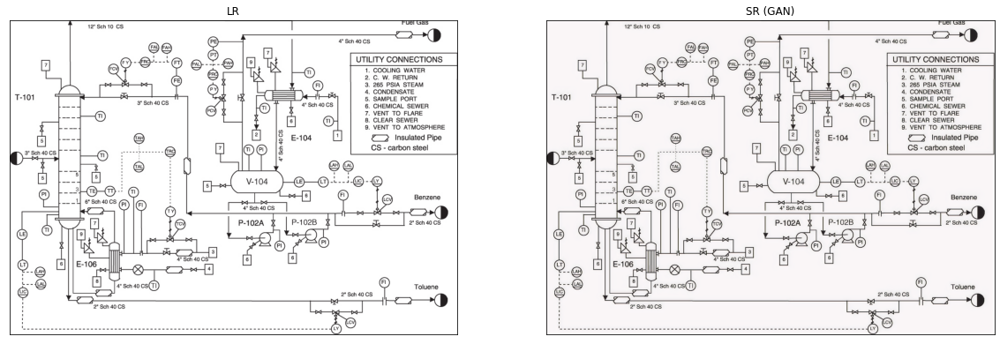

In [ ]:
from model.srgan import generator
from model import resolve_single
from util import load_image
import matplotlib.pyplot as plt
def resolve_and_plot(lr_image_path):
    lr = load_image(lr_image_path)
    gan_sr = resolve_single(gan_generator, lr)
    plt.figure(figsize=(20, 20))
    
    images = [lr, gan_sr]
    titles = ['LR', 'SR (GAN)']
    positions = [1,2]
    
    for i, (img, title, pos) in enumerate(zip(images, titles, positions)):
        plt.subplot(2, 2, pos)
        plt.imshow(img)
        plt.title(title)
        plt.xticks([])
        plt.yticks([])
    return gan_sr
gan_generator = generator()
gan_generator.load_weights(path_to_srgan)
lr="/content/img.jpg"
img=resolve_and_plot(lr)
cv2.imread(lr).shape,img.shape

In [ ]:
%cd ../

/content


In [ ]:
model=torch.hub.load('ultralytics/yolov5','custom',path=path_to_model,force_reload=True)

/usr/local/lib/python3.9/dist-packages/torch/hub.py:267: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
requirements: YOLOv5 requirements "gitpython>=3.1.30" "setuptools>=65.5.1" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import copy
img_temp=copy.copy(img.numpy())

In [ ]:
result=model(img_temp)

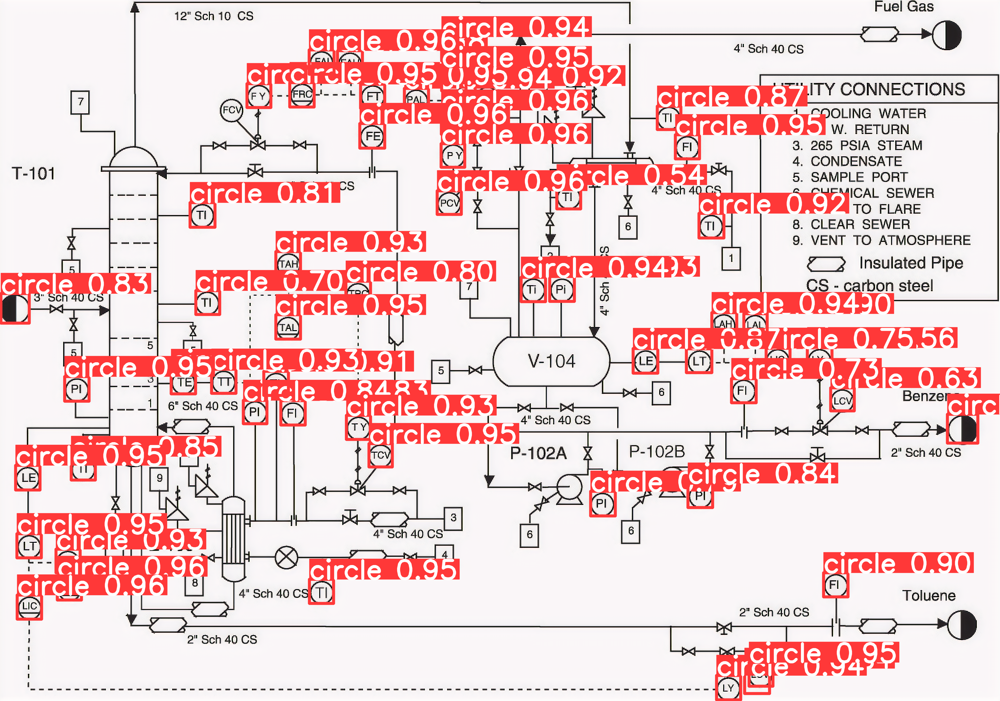

In [ ]:
result.show()

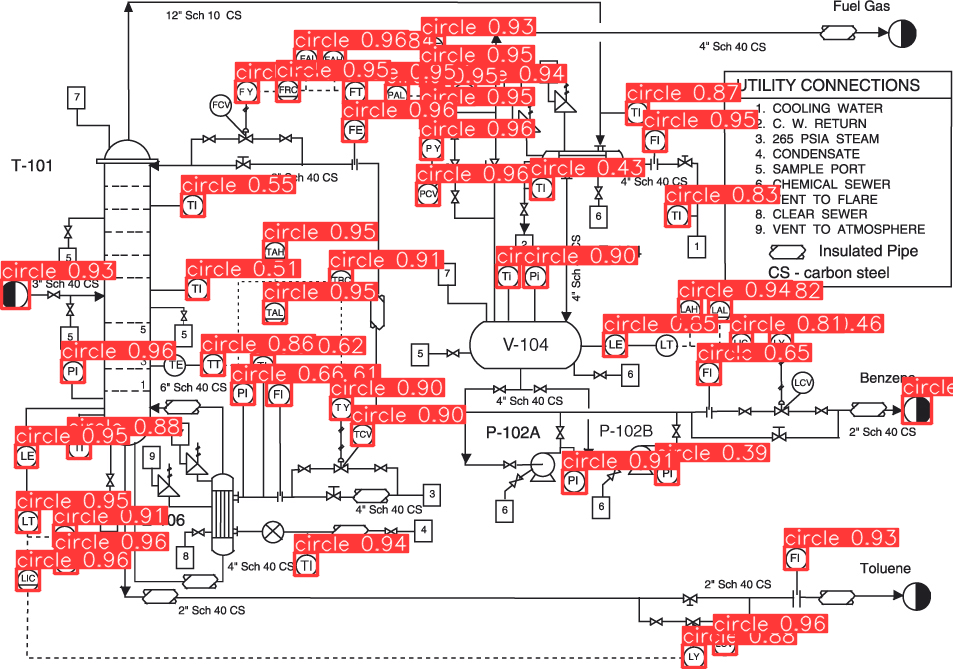

In [ ]:
t=model(cv2.imread("/content/img.jpg"))
t.show()

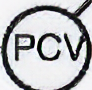

In [ ]:
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
i=list(map(int,result.xyxy[0].tolist()[0]))
img=img.numpy()
cv2_imshow(img[i[1]:i[3],i[0]:i[2],:])


In [ ]:
img_cords=[]
for i in result.xyxy:
  img_cords+=i.tolist()
imgs=[img[int(i[1]):int(i[3]),int(i[0]):int(i[2]),:] for i in img_cords]

In [ ]:
from paddleocr import PaddleOCR,draw_ocr
ocr = PaddleOCR(lang='en',) # need to run only once to download and load model into memory

[2023/03/10 17:27:46] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:46] ppocr DEBUG: dt_boxes num : 1, elapse : 0.09149670600891113
[2023/03/10 17:27:46] ppocr DEBUG: rec_res num  : 1, elapse : 0.22344040870666504


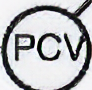

[[[[[12.0, 29.0], [80.0, 29.0], [80.0, 65.0], [12.0, 65.0]], ('PCV', 0.9616795182228088)]]]
[2023/03/10 17:27:46] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:47] ppocr DEBUG: dt_boxes num : 1, elapse : 0.0539097785949707
[2023/03/10 17:27:47] ppocr DEBUG: rec_res num  : 1, elapse : 0.17991399765014648


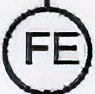

[[[[[17.0, 30.0], [84.0, 30.0], [84.0, 69.0], [17.0, 69.0]], ('FE', 0.9952313899993896)]]]
[2023/03/10 17:27:47] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:47] ppocr DEBUG: dt_boxes num : 1, elapse : 0.025862693786621094
[2023/03/10 17:27:47] ppocr DEBUG: rec_res num  : 1, elapse : 0.21289658546447754


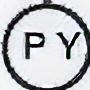

[[[[[17.0, 26.0], [82.0, 26.0], [82.0, 66.0], [17.0, 66.0]], ('PY', 0.9934752583503723)]]]
[2023/03/10 17:27:47] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:47] ppocr DEBUG: dt_boxes num : 1, elapse : 0.026500940322875977
[2023/03/10 17:27:47] ppocr DEBUG: rec_res num  : 1, elapse : 0.16274380683898926


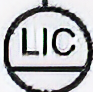

[[[[[12.0, 23.0], [80.0, 23.0], [80.0, 60.0], [12.0, 60.0]], ('LIC', 0.9855641722679138)]]]
[2023/03/10 17:27:47] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:47] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02478790283203125
[2023/03/10 17:27:47] ppocr DEBUG: rec_res num  : 1, elapse : 0.13435840606689453


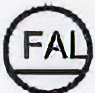

[[[[[12.0, 25.0], [85.0, 23.0], [86.0, 61.0], [14.0, 63.0]], ('FAL', 0.9970442652702332)]]]
[2023/03/10 17:27:47] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:47] ppocr DEBUG: dt_boxes num : 1, elapse : 0.052959442138671875
[2023/03/10 17:27:48] ppocr DEBUG: rec_res num  : 1, elapse : 0.13134312629699707


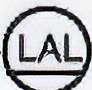

[[[[[11.0, 30.0], [80.0, 30.0], [80.0, 66.0], [11.0, 66.0]], ('LAL', 0.9979655146598816)]]]
[2023/03/10 17:27:48] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:48] ppocr DEBUG: dt_boxes num : 1, elapse : 0.030870437622070312
[2023/03/10 17:27:48] ppocr DEBUG: rec_res num  : 1, elapse : 0.07893610000610352


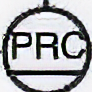

[[[[[6.0, 27.0], [84.0, 27.0], [84.0, 66.0], [6.0, 66.0]], ('PRC', 0.9793429970741272)]]]
[2023/03/10 17:27:48] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:48] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02179431915283203
[2023/03/10 17:27:48] ppocr DEBUG: rec_res num  : 1, elapse : 0.07467937469482422


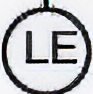

[[[[[53.0, 35.0], [76.0, 35.0], [76.0, 61.0], [53.0, 61.0]], ('E', 0.5591358542442322)]]]
[2023/03/10 17:27:48] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:48] ppocr DEBUG: dt_boxes num : 0, elapse : 0.015517234802246094
[2023/03/10 17:27:48] ppocr DEBUG: rec_res num  : 0, elapse : 1.9073486328125e-06


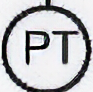

[[]]
[2023/03/10 17:27:48] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:48] ppocr DEBUG: dt_boxes num : 1, elapse : 0.029565811157226562
[2023/03/10 17:27:48] ppocr DEBUG: rec_res num  : 1, elapse : 0.07441377639770508


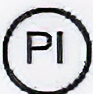

[[[[[19.0, 27.0], [72.0, 27.0], [72.0, 68.0], [19.0, 68.0]], ('PI', 0.9486331343650818)]]]
[2023/03/10 17:27:48] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:48] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02257704734802246
[2023/03/10 17:27:48] ppocr DEBUG: rec_res num  : 1, elapse : 0.0823519229888916


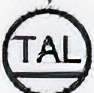

[[[[[11.0, 31.0], [82.0, 31.0], [82.0, 67.0], [11.0, 67.0]], ('TAL', 0.9978452324867249)]]]
[2023/03/10 17:27:48] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:48] ppocr DEBUG: dt_boxes num : 1, elapse : 0.0234677791595459
[2023/03/10 17:27:48] ppocr DEBUG: rec_res num  : 1, elapse : 0.07584810256958008


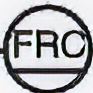

[[[[[11.0, 25.0], [84.0, 25.0], [84.0, 62.0], [11.0, 62.0]], ('FRO', 0.9923911094665527)]]]
[2023/03/10 17:27:48] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:48] ppocr DEBUG: dt_boxes num : 1, elapse : 0.023890018463134766
[2023/03/10 17:27:48] ppocr DEBUG: rec_res num  : 1, elapse : 0.09406423568725586


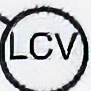

[[[[[11.0, 29.0], [75.0, 29.0], [75.0, 62.0], [11.0, 62.0]], ('LCV', 0.9783644676208496)]]]
[2023/03/10 17:27:48] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:48] ppocr DEBUG: dt_boxes num : 1, elapse : 0.021134614944458008
[2023/03/10 17:27:48] ppocr DEBUG: rec_res num  : 1, elapse : 0.08921527862548828


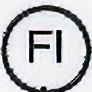

[[[[[20.0, 26.0], [70.0, 26.0], [70.0, 66.0], [20.0, 66.0]], ('FI', 0.7936605215072632)]]]
[2023/03/10 17:27:48] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:49] ppocr DEBUG: dt_boxes num : 0, elapse : 0.020938634872436523
[2023/03/10 17:27:49] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06


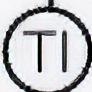

[[]]
[2023/03/10 17:27:49] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:49] ppocr DEBUG: dt_boxes num : 1, elapse : 0.026407241821289062
[2023/03/10 17:27:49] ppocr DEBUG: rec_res num  : 1, elapse : 0.0785210132598877


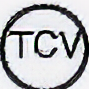

[[[[[6.0, 26.0], [78.0, 24.0], [79.0, 60.0], [7.0, 62.0]], ('TCV', 0.9913733005523682)]]]
[2023/03/10 17:27:49] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:49] ppocr DEBUG: dt_boxes num : 1, elapse : 0.027755022048950195
[2023/03/10 17:27:49] ppocr DEBUG: rec_res num  : 1, elapse : 0.08028769493103027


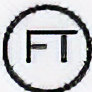

[[[[[26.0, 34.0], [67.0, 34.0], [67.0, 59.0], [26.0, 59.0]], ('FI', 0.8285892009735107)]]]
[2023/03/10 17:27:49] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:49] ppocr DEBUG: dt_boxes num : 1, elapse : 0.024146318435668945
[2023/03/10 17:27:49] ppocr DEBUG: rec_res num  : 1, elapse : 0.07631611824035645


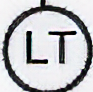

[[[[[16.0, 30.0], [77.0, 30.0], [77.0, 67.0], [16.0, 67.0]], ('LT', 0.9871273040771484)]]]
[2023/03/10 17:27:49] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:49] ppocr DEBUG: dt_boxes num : 1, elapse : 0.026341676712036133
[2023/03/10 17:27:49] ppocr DEBUG: rec_res num  : 1, elapse : 0.07493400573730469


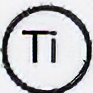

[[]]
[2023/03/10 17:27:49] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:49] ppocr DEBUG: dt_boxes num : 1, elapse : 0.026695966720581055
[2023/03/10 17:27:49] ppocr DEBUG: rec_res num  : 1, elapse : 0.07852697372436523


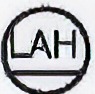

[[[[[13.0, 20.0], [84.0, 26.0], [80.0, 64.0], [9.0, 57.0]], ('LAH', 0.9922246336936951)]]]
[2023/03/10 17:27:49] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:49] ppocr DEBUG: dt_boxes num : 1, elapse : 0.023683786392211914
[2023/03/10 17:27:49] ppocr DEBUG: rec_res num  : 1, elapse : 0.08328700065612793


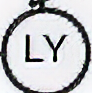

[[[[[16.0, 31.0], [71.0, 31.0], [71.0, 66.0], [16.0, 66.0]], ('LY', 0.9997499585151672)]]]
[2023/03/10 17:27:49] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:49] ppocr DEBUG: dt_boxes num : 1, elapse : 0.0266110897064209
[2023/03/10 17:27:49] ppocr DEBUG: rec_res num  : 1, elapse : 0.07859253883361816


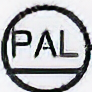

[[[[[11.0, 24.0], [79.0, 24.0], [79.0, 61.0], [11.0, 61.0]], ('PAL', 0.9989087581634521)]]]
[2023/03/10 17:27:49] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:49] ppocr DEBUG: dt_boxes num : 1, elapse : 0.026097774505615234
[2023/03/10 17:27:49] ppocr DEBUG: rec_res num  : 1, elapse : 0.09250164031982422


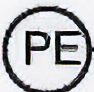

[[[[[15.0, 27.0], [85.0, 27.0], [85.0, 68.0], [15.0, 68.0]], ('PE', 0.9973441362380981)]]]
[2023/03/10 17:27:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:50] ppocr DEBUG: dt_boxes num : 1, elapse : 0.023311853408813477
[2023/03/10 17:27:50] ppocr DEBUG: rec_res num  : 1, elapse : 0.08242177963256836


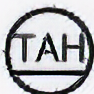

[[[[[8.0, 28.0], [85.0, 25.0], [87.0, 66.0], [10.0, 69.0]], ('TAH', 0.9971815943717957)]]]
[2023/03/10 17:27:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:50] ppocr DEBUG: dt_boxes num : 1, elapse : 0.026531219482421875
[2023/03/10 17:27:50] ppocr DEBUG: rec_res num  : 1, elapse : 0.08642983436584473


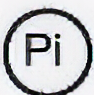

[[[[[14.0, 31.0], [67.0, 26.0], [70.0, 66.0], [17.0, 71.0]], ('Pi', 0.9891555309295654)]]]
[2023/03/10 17:27:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:50] ppocr DEBUG: dt_boxes num : 0, elapse : 0.023039817810058594
[2023/03/10 17:27:50] ppocr DEBUG: rec_res num  : 0, elapse : 2.384185791015625e-06


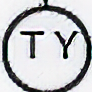

[[]]
[2023/03/10 17:27:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:50] ppocr DEBUG: dt_boxes num : 1, elapse : 0.024798870086669922
[2023/03/10 17:27:50] ppocr DEBUG: rec_res num  : 1, elapse : 0.09479427337646484


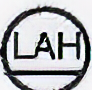

[[[[[10.0, 26.0], [85.0, 26.0], [85.0, 65.0], [10.0, 65.0]], ('LAH', 0.9977948665618896)]]]
[2023/03/10 17:27:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:50] ppocr DEBUG: dt_boxes num : 0, elapse : 0.023500442504882812
[2023/03/10 17:27:50] ppocr DEBUG: rec_res num  : 0, elapse : 1.6689300537109375e-06


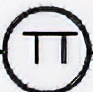

[[]]
[2023/03/10 17:27:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:50] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02487945556640625
[2023/03/10 17:27:50] ppocr DEBUG: rec_res num  : 1, elapse : 0.0926675796508789


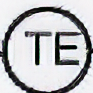

[[[[[18.0, 28.0], [83.0, 28.0], [83.0, 70.0], [18.0, 70.0]], ('TE', 0.9970048069953918)]]]
[2023/03/10 17:27:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:50] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02776169776916504
[2023/03/10 17:27:50] ppocr DEBUG: rec_res num  : 1, elapse : 0.08156418800354004


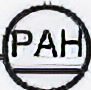

[[[[[8.0, 22.0], [84.0, 22.0], [84.0, 64.0], [8.0, 64.0]], ('PAH', 0.9983344674110413)]]]
[2023/03/10 17:27:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:50] ppocr DEBUG: dt_boxes num : 0, elapse : 0.017102718353271484
[2023/03/10 17:27:50] ppocr DEBUG: rec_res num  : 0, elapse : 2.1457672119140625e-06


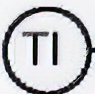

[[]]
[2023/03/10 17:27:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:50] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02629542350769043
[2023/03/10 17:27:50] ppocr DEBUG: rec_res num  : 1, elapse : 0.0976564884185791


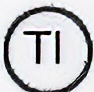

[[[[[28.0, 34.0], [61.0, 34.0], [61.0, 62.0], [28.0, 62.0]], ('T1', 0.7090444564819336)]]]
[2023/03/10 17:27:50] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:50] ppocr DEBUG: dt_boxes num : 1, elapse : 0.026795625686645508
[2023/03/10 17:27:51] ppocr DEBUG: rec_res num  : 1, elapse : 0.08419227600097656


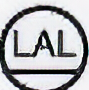

[[[[[10.0, 26.0], [74.0, 23.0], [75.0, 56.0], [11.0, 58.0]], ('LAL', 0.9986547827720642)]]]
[2023/03/10 17:27:51] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:51] ppocr DEBUG: dt_boxes num : 1, elapse : 0.024546384811401367
[2023/03/10 17:27:51] ppocr DEBUG: rec_res num  : 1, elapse : 0.08618402481079102


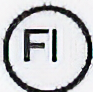

[[[[[16.0, 25.0], [64.0, 25.0], [64.0, 66.0], [16.0, 66.0]], ('FI', 0.7896853089332581)]]]
[2023/03/10 17:27:51] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:51] ppocr DEBUG: dt_boxes num : 1, elapse : 0.027118206024169922
[2023/03/10 17:27:51] ppocr DEBUG: rec_res num  : 1, elapse : 0.0899801254272461


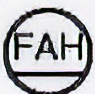

[[[[[12.0, 21.0], [88.0, 27.0], [84.0, 69.0], [8.0, 62.0]], ('FAH', 0.9965713620185852)]]]
[2023/03/10 17:27:51] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:51] ppocr DEBUG: dt_boxes num : 0, elapse : 0.03091597557067871
[2023/03/10 17:27:51] ppocr DEBUG: rec_res num  : 0, elapse : 2.1457672119140625e-06


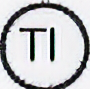

[[]]
[2023/03/10 17:27:51] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:51] ppocr DEBUG: dt_boxes num : 1, elapse : 0.035683393478393555
[2023/03/10 17:27:51] ppocr DEBUG: rec_res num  : 1, elapse : 0.09523749351501465


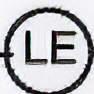

[[[[[47.0, 30.0], [77.0, 30.0], [77.0, 64.0], [47.0, 64.0]], ('E', 0.9882035851478577)]]]
[2023/03/10 17:27:51] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:51] ppocr DEBUG: dt_boxes num : 0, elapse : 0.024927377700805664
[2023/03/10 17:27:51] ppocr DEBUG: rec_res num  : 0, elapse : 1.9073486328125e-06


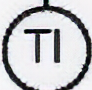

[[]]
[2023/03/10 17:27:51] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:51] ppocr DEBUG: dt_boxes num : 1, elapse : 0.026569366455078125
[2023/03/10 17:27:51] ppocr DEBUG: rec_res num  : 1, elapse : 0.1197214126586914


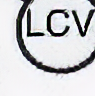

[[[[[21.0, 6.0], [93.0, 6.0], [93.0, 40.0], [21.0, 40.0]], ('LCV', 0.9937049746513367)]]]
[2023/03/10 17:27:51] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:51] ppocr DEBUG: dt_boxes num : 1, elapse : 0.030106306076049805
[2023/03/10 17:27:51] ppocr DEBUG: rec_res num  : 1, elapse : 0.08018779754638672


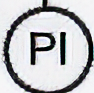

[[[[[24.0, 28.0], [76.0, 28.0], [76.0, 69.0], [24.0, 69.0]], ('PI', 0.9147346019744873)]]]
[2023/03/10 17:27:51] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:51] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02270054817199707
[2023/03/10 17:27:51] ppocr DEBUG: rec_res num  : 1, elapse : 0.08117794990539551


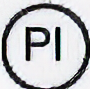

[[[[[17.0, 21.0], [70.0, 21.0], [70.0, 65.0], [17.0, 65.0]], ('PI', 0.9312731027603149)]]]
[2023/03/10 17:27:51] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:52] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02655506134033203
[2023/03/10 17:27:52] ppocr DEBUG: rec_res num  : 1, elapse : 0.09745573997497559


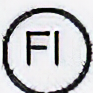

[[[[[16.0, 27.0], [68.0, 27.0], [68.0, 68.0], [16.0, 68.0]], ('FI', 0.9133572578430176)]]]
[2023/03/10 17:27:52] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:52] ppocr DEBUG: dt_boxes num : 0, elapse : 0.020398855209350586
[2023/03/10 17:27:52] ppocr DEBUG: rec_res num  : 0, elapse : 1.9073486328125e-06


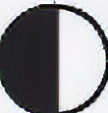

[[]]
[2023/03/10 17:27:52] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:52] ppocr DEBUG: dt_boxes num : 1, elapse : 0.032152414321899414
[2023/03/10 17:27:52] ppocr DEBUG: rec_res num  : 1, elapse : 0.1240692138671875


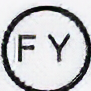

[[]]
[2023/03/10 17:27:52] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:52] ppocr DEBUG: dt_boxes num : 0, elapse : 0.031091690063476562
[2023/03/10 17:27:52] ppocr DEBUG: rec_res num  : 0, elapse : 2.1457672119140625e-06


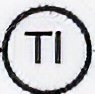

[[]]
[2023/03/10 17:27:52] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:52] ppocr DEBUG: dt_boxes num : 1, elapse : 0.026962995529174805
[2023/03/10 17:27:52] ppocr DEBUG: rec_res num  : 1, elapse : 0.12036848068237305


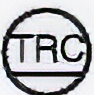

[[[[[7.0, 32.0], [84.0, 29.0], [86.0, 66.0], [8.0, 69.0]], ('TRC', 0.9950392842292786)]]]
[2023/03/10 17:27:52] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:52] ppocr DEBUG: dt_boxes num : 1, elapse : 0.024861574172973633
[2023/03/10 17:27:52] ppocr DEBUG: rec_res num  : 1, elapse : 0.15232157707214355


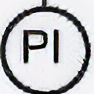

[[[[[12.0, 29.0], [58.0, 22.0], [64.0, 61.0], [18.0, 68.0]], ('PI', 0.9370560646057129)]]]
[2023/03/10 17:27:52] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:52] ppocr DEBUG: dt_boxes num : 1, elapse : 0.027560949325561523
[2023/03/10 17:27:52] ppocr DEBUG: rec_res num  : 1, elapse : 0.13178658485412598


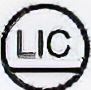

[[[[[9.0, 22.0], [76.0, 22.0], [76.0, 61.0], [9.0, 61.0]], ('LIC', 0.9934414029121399)]]]
[2023/03/10 17:27:52] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:52] ppocr DEBUG: dt_boxes num : 1, elapse : 0.027588605880737305
[2023/03/10 17:27:53] ppocr DEBUG: rec_res num  : 1, elapse : 0.12327694892883301


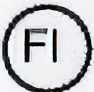

[[[[[20.0, 25.0], [63.0, 25.0], [63.0, 65.0], [20.0, 65.0]], ('FI', 0.910038411617279)]]]
[2023/03/10 17:27:53] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:53] ppocr DEBUG: dt_boxes num : 1, elapse : 0.029337406158447266
[2023/03/10 17:27:53] ppocr DEBUG: rec_res num  : 1, elapse : 0.12479925155639648


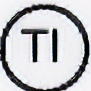

[[[[[23.0, 27.0], [60.0, 27.0], [60.0, 61.0], [23.0, 61.0]], ('TI', 0.8274884223937988)]]]
[2023/03/10 17:27:53] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:53] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02873706817626953
[2023/03/10 17:27:53] ppocr DEBUG: rec_res num  : 1, elapse : 0.136033296585083


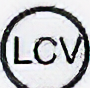

[[[[[10.0, 32.0], [81.0, 32.0], [81.0, 67.0], [10.0, 67.0]], ('LCV', 0.979884684085846)]]]
[2023/03/10 17:27:53] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:53] ppocr DEBUG: dt_boxes num : 0, elapse : 0.026874303817749023
[2023/03/10 17:27:53] ppocr DEBUG: rec_res num  : 0, elapse : 1.9073486328125e-06


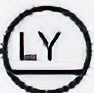

[[]]
[2023/03/10 17:27:53] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:53] ppocr DEBUG: dt_boxes num : 0, elapse : 0.0210416316986084
[2023/03/10 17:27:53] ppocr DEBUG: rec_res num  : 0, elapse : 1.9073486328125e-06


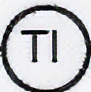

[[]]
[2023/03/10 17:27:53] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:53] ppocr DEBUG: dt_boxes num : 0, elapse : 0.022548198699951172
[2023/03/10 17:27:53] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06


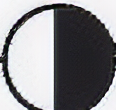

[[]]
[2023/03/10 17:27:53] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/10 17:27:53] ppocr DEBUG: dt_boxes num : 1, elapse : 0.024004459381103516
[2023/03/10 17:27:53] ppocr DEBUG: rec_res num  : 1, elapse : 0.12780404090881348


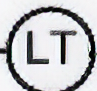

[[[[[20.0, 28.0], [79.0, 28.0], [79.0, 66.0], [20.0, 66.0]], ('LT', 0.9958710074424744)]]]


In [ ]:
for i in imgs:
  sr_img=
  r=ocr.ocr(i)
  print(r)

In [ ]:
!pip install easyocr -q
import easyocr
reader = easyocr.Reader(['en']) # this needs to run only once to load the model into memory

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 55.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 KB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 7.2 MB/s eta 0:00:00


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [ ]:
for i in imgs:
  r=reader.readtext(i)
  cv2_imshow(i)
  print(r)

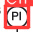

[2023/03/08 19:24:07] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:07] ppocr DEBUG: dt_boxes num : 1, elapse : 0.018362045288085938
[2023/03/08 19:24:07] ppocr DEBUG: rec_res num  : 1, elapse : 0.10956120491027832
[[[[[9.0, 8.0], [24.0, 8.0], [24.0, 23.0], [9.0, 23.0]], ('PI', 0.9604844450950623)]]]


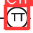

[2023/03/08 19:24:07] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:07] ppocr DEBUG: dt_boxes num : 1, elapse : 0.015352487564086914
[2023/03/08 19:24:07] ppocr DEBUG: rec_res num  : 1, elapse : 0.1110999584197998
[[[[[9.0, 10.0], [23.0, 10.0], [23.0, 24.0], [9.0, 24.0]], ('TI', 0.7388812899589539)]]]


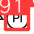

[2023/03/08 19:24:07] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:07] ppocr DEBUG: dt_boxes num : 0, elapse : 0.012809514999389648
[2023/03/08 19:24:07] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


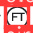

[2023/03/08 19:24:07] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:07] ppocr DEBUG: dt_boxes num : 1, elapse : 0.018677473068237305
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 1, elapse : 0.11449456214904785
[[]]


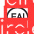

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 0, elapse : 0.01175546646118164
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


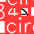

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 0, elapse : 0.011625289916992188
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


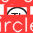

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 0, elapse : 0.014547348022460938
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 0, elapse : 1.1920928955078125e-06
[[]]


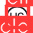

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 0, elapse : 0.012058734893798828
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 0, elapse : 1.1920928955078125e-06
[[]]


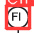

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 1, elapse : 0.01230764389038086
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 1, elapse : 0.134934663772583
[[[[[10.0, 8.0], [23.0, 8.0], [23.0, 23.0], [10.0, 23.0]], ('FI', 0.958851158618927)]]]


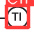

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 1, elapse : 0.015575408935546875
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 1, elapse : 0.11189436912536621
[[[[[10.0, 8.0], [23.0, 8.0], [23.0, 23.0], [10.0, 23.0]], ('TI', 0.9675077199935913)]]]


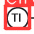

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 1, elapse : 0.01402425765991211
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 1, elapse : 0.11207389831542969
[[[[[5.0, 8.0], [26.0, 5.0], [29.0, 26.0], [8.0, 29.0]], ('?', 0.517695426940918)]]]


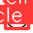

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 0, elapse : 0.01253199577331543
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 0, elapse : 1.6689300537109375e-06
[[]]


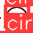

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 0, elapse : 0.01110076904296875
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


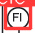

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 1, elapse : 0.017630815505981445
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 1, elapse : 0.1255204677581787
[[[[[9.0, 10.0], [25.0, 10.0], [25.0, 26.0], [9.0, 26.0]], ('FI', 0.9240481853485107)]]]


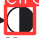

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 0, elapse : 0.021914243698120117
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 0, elapse : 1.9073486328125e-06
[[]]


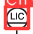

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 0, elapse : 0.02121257781982422
[2023/03/08 19:24:08] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


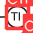

[2023/03/08 19:24:08] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:08] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02356576919555664
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 1, elapse : 0.11542630195617676
[[]]


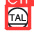

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 0, elapse : 0.022017240524291992
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 0, elapse : 1.1920928955078125e-06
[[]]


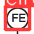

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 1, elapse : 0.02116703987121582
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 1, elapse : 0.11888456344604492
[[[[[8.0, 8.0], [28.0, 8.0], [28.0, 27.0], [8.0, 27.0]], ('FE', 0.8085416555404663)]]]


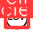

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 0, elapse : 0.016712427139282227
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 0, elapse : 1.9073486328125e-06
[[]]


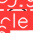

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 1, elapse : 0.017360210418701172
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 1, elapse : 0.12236452102661133
[[[[[9.0, 14.0], [24.0, 14.0], [24.0, 27.0], [9.0, 27.0]], ('Te', 0.5528345108032227)]]]


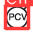

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 0, elapse : 0.017960071563720703
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


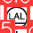

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 1, elapse : 0.018379926681518555
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 1, elapse : 0.11378240585327148
[[]]


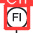

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 1, elapse : 0.019480466842651367
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 1, elapse : 0.1174018383026123
[[[[[7.0, 7.0], [27.0, 7.0], [27.0, 27.0], [7.0, 27.0]], ('?', 0.6822929978370667)]]]


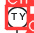

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 0, elapse : 0.011931419372558594
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


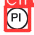

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 0, elapse : 0.01632380485534668
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 0, elapse : 1.1920928955078125e-06
[[]]


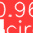

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 0, elapse : 0.014281749725341797
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


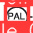

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 1, elapse : 0.01374197006225586
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 1, elapse : 0.13522696495056152
[[[[[4.0, 5.0], [29.0, 5.0], [29.0, 25.0], [4.0, 25.0]], ('FAL', 0.8241062164306641)]]]


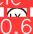

[2023/03/08 19:24:09] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:09] ppocr DEBUG: dt_boxes num : 0, elapse : 0.011909246444702148
[2023/03/08 19:24:09] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


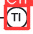

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 1, elapse : 0.01381993293762207
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 1, elapse : 0.1203916072845459
[[[[[9.0, 8.0], [23.0, 8.0], [23.0, 26.0], [9.0, 26.0]], ('TI', 0.9489225149154663)]]]


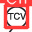

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 1, elapse : 0.014722824096679688
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 1, elapse : 0.11976480484008789
[[[[[7.0, 7.0], [27.0, 7.0], [27.0, 24.0], [7.0, 24.0]], ('TCV', 0.9625279307365417)]]]


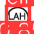

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 1, elapse : 0.014594078063964844
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 1, elapse : 0.1148824691772461
[[[[[6.0, 5.0], [29.0, 5.0], [29.0, 24.0], [6.0, 24.0]], ('AH', 0.9229733943939209)]]]


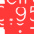

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 0, elapse : 0.015948057174682617
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


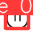

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 0, elapse : 0.01411294937133789
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


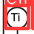

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 0, elapse : 0.013086080551147461
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 0, elapse : 1.1920928955078125e-06
[[]]


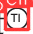

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 0, elapse : 0.011458635330200195
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


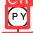

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 0, elapse : 0.014894723892211914
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 0, elapse : 1.430511474609375e-06
[[]]


[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 0, elapse : 0.014306306838989258
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 0, elapse : 1.1920928955078125e-06
[[]]


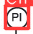

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 1, elapse : 0.017513036727905273
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 1, elapse : 0.13841986656188965
[[[[[8.0, 7.0], [27.0, 7.0], [27.0, 26.0], [8.0, 26.0]], ('PI', 0.8418492674827576)]]]


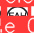

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 0, elapse : 0.013706207275390625
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 0, elapse : 1.1920928955078125e-06
[[]]


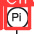

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 1, elapse : 0.012541532516479492
[2023/03/08 19:24:10] ppocr DEBUG: rec_res num  : 1, elapse : 0.13488149642944336
[[[[[8.0, 7.0], [28.0, 7.0], [28.0, 27.0], [8.0, 27.0]], ('P', 0.9406090378761292)]]]


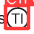

[2023/03/08 19:24:10] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:10] ppocr DEBUG: dt_boxes num : 1, elapse : 0.01619887351989746
[2023/03/08 19:24:11] ppocr DEBUG: rec_res num  : 1, elapse : 0.13043618202209473
[[]]


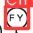

[2023/03/08 19:24:11] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:11] ppocr DEBUG: dt_boxes num : 0, elapse : 0.019393444061279297
[2023/03/08 19:24:11] ppocr DEBUG: rec_res num  : 0, elapse : 1.6689300537109375e-06
[[]]


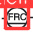

[2023/03/08 19:24:11] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:11] ppocr DEBUG: dt_boxes num : 1, elapse : 0.019876718521118164
[2023/03/08 19:24:11] ppocr DEBUG: rec_res num  : 1, elapse : 0.14270401000976562
[[[[[11.0, 15.0], [19.0, 15.0], [19.0, 22.0], [11.0, 22.0]], ('H', 0.8546607494354248)]]]


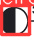

[2023/03/08 19:24:11] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:11] ppocr DEBUG: dt_boxes num : 0, elapse : 0.013718128204345703
[2023/03/08 19:24:11] ppocr DEBUG: rec_res num  : 0, elapse : 1.6689300537109375e-06
[[]]


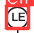

[2023/03/08 19:24:11] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:11] ppocr DEBUG: dt_boxes num : 1, elapse : 0.014520406723022461
[2023/03/08 19:24:11] ppocr DEBUG: rec_res num  : 1, elapse : 0.11608099937438965
[[[[[10.0, 8.0], [27.0, 8.0], [27.0, 23.0], [10.0, 23.0]], ('LE', 0.9950214624404907)]]]


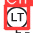

[2023/03/08 19:24:11] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:11] ppocr DEBUG: dt_boxes num : 0, elapse : 0.016521453857421875
[2023/03/08 19:24:11] ppocr DEBUG: rec_res num  : 0, elapse : 1.6689300537109375e-06
[[]]


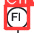

[2023/03/08 19:24:11] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:11] ppocr DEBUG: dt_boxes num : 1, elapse : 0.015310287475585938
[2023/03/08 19:24:11] ppocr DEBUG: rec_res num  : 1, elapse : 0.12867474555969238
[[]]


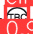

[2023/03/08 19:24:11] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:11] ppocr DEBUG: dt_boxes num : 0, elapse : 0.01500701904296875
[2023/03/08 19:24:11] ppocr DEBUG: rec_res num  : 0, elapse : 1.6689300537109375e-06
[[]]


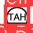

[2023/03/08 19:24:11] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:11] ppocr DEBUG: dt_boxes num : 1, elapse : 0.014991283416748047
[2023/03/08 19:24:11] ppocr DEBUG: rec_res num  : 1, elapse : 0.12095260620117188
[[[[[4.0, 4.0], [29.0, 4.0], [29.0, 27.0], [4.0, 27.0]], ('FAH', 0.6956695914268494)]]]


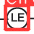

[2023/03/08 19:24:11] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process
[2023/03/08 19:24:11] ppocr DEBUG: dt_boxes num : 1, elapse : 0.015490293502807617
[2023/03/08 19:24:11] ppocr DEBUG: rec_res num  : 1, elapse : 0.12353396415710449
[[]]


In [ ]:
from google.colab.patches import cv2_imshow
for img in l:
  i=cv2.imread(p+img)
  cv2_imshow(i)
  print(ocr.ocr(p+img))